### Read the data on the SPX index; the first column is the "total return" which incorporates corporate actions

In [1]:
lines = readlines("../data/sp.txt")

24420-element Array{String,1}:
 " "                                                                                                                                                                                                                                                               
 "                                                                                                                                                                                                                                                                "
 " "                                                                                                                                                                                                                                                               
 "   caldt        vwretd        sprtrn      spindx"                                                                                                                                          

### Work out which row the data seems to start on

In [2]:
length.(lines)

24420-element Array{Int64,1}:
   1
 256
   1
  48
   0
  48
  48
  48
  48
  48
  48
  48
  48
   ⋮
  48
  48
  48
  48
  48
  48
  48
  48
  48
  48
  48
  48

### Check the intermediate rows

In [3]:
unique(length.(lines[6:end]))

1-element Array{Int64,1}:
 48

### Isolate the first column

In [4]:
[line[14:22] for line in lines[7:end]]

24414-element Array{String,1}:
 " 0.004297"
 "-0.001357"
 "-0.004603"
 " 0.000537"
 " 0.003907"
 "-0.002693"
 " 0.002218"
 "-0.006515"
 "-0.001597"
 " 0.003465"
 "-0.005732"
 "-0.012153"
 "-0.000511"
 ⋮          
 " 0.002792"
 "-0.000889"
 "-0.002019"
 "-0.003911"
 " 0.001673"
 "-0.006173"
 " 0.001880"
 "-0.013623"
 " 0.002201"
 "-0.008636"
 " 0.006236"
 " 0.000819"

### Parse the first column

In [5]:
returns = [parse(Float64,line[14:22]) for line in lines[7:end]]

24414-element Array{Float64,1}:
  0.004297
 -0.001357
 -0.004603
  0.000537
  0.003907
 -0.002693
  0.002218
 -0.006515
 -0.001597
  0.003465
 -0.005732
 -0.012153
 -0.000511
  ⋮       
  0.002792
 -0.000889
 -0.002019
 -0.003911
  0.001673
 -0.006173
  0.00188 
 -0.013623
  0.002201
 -0.008636
  0.006236
  0.000819

### Import some basic statistics functions

In [6]:
using StatsBase

In [15]:
using Plots

In [18]:
Pkg.add("NLopt")

  Updating registry at `/home/jrun/.julia/registries/JuliaPro`
  Updating git-repo `https://pkg.juliacomputing.com/registry/JuliaPro`
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]


In [19]:
using NLopt

In [105]:
function f(w::Vector{Float64}, g::Vector{Float64}, r::Vector{Float64}, p::Vector{Float64}, gamma::Float64)
    g[1] = gamma*dot(p, r .* (1 .+ w[1] .* r).^(gamma-1))
    return dot(p, (1 .+ w[1] .* r).^gamma) 
end

f (generic function with 3 methods)

In [112]:
function findw(r::Vector{Float64}, p::Vector{Float64}, gamma::Float64)
    problem = Opt(:LD_MMA,1)
    lower_bounds!(problem,[max(-10.0,-1/maximum(r))])
    upper_bounds!(problem,[min(10.0,-1/minimum(r))])
    xtol_rel!(problem,1e-4)
    max_objective!(problem,(w,g)->f(w,g,r,p,gamma))
    (minf,w,ret)=optimize(problem,[0.5])
    @assert( ret == :XTOL_REACHED )
    return w[1]
end

findw (generic function with 2 methods)

In [136]:
wrs = Vector{Float64}[]
lagyears = [1,2,5,10,25]
for lag in 252*lagyears
    println( "lag=$lag")
    flush(stdout)
    push!( wrs, Float64[] )
    for year = 1:25
        println( "year=$year")
        flush(stdout)
        trainingdata = returns[end+(year-26)*252-lag+1:end+(year-26)*252]
        (lo,hi) = StatsBase.quantile(trainingdata,[1/3,2/3])
        trainingtertiles = [searchsorted([lo,hi],r).start for r in trainingdata]
        n = [sum((trainingtertiles[1:end-1].==i).&(trainingtertiles[2:end].==j)) for i in 1:3, j in 1:3]
        P = n./sum(n,dims=2)
        
        w = fill(NaN,3)
        for i = 1:3
            p = [P[i,tt] for tt in trainingtertiles[2:end]]
            w[i] = findw(trainingdata[2:end], p, 0.5)
        end 

        statedata = returns[end+(year-26)*252:end+(year-25)*252-1]
        statetertiles = [searchsorted([lo,hi],r).start for r in statedata]

        testdata = returns[end+(year-26)*252+1:end+(year-25)*252]
        wrs[end] = vcat(wrs[end], [w[statetertiles[i]]*testdata[i] for i in 1:length(testdata)])
    end
end

lag=252
year=1
year=2
year=3
year=4
year=5
year=6
year=7
year=8
year=9
year=10
year=11
year=12
year=13
year=14
year=15
year=16
year=17


AssertionError: AssertionError: ret == :XTOL_REACHED

In [114]:
plot((1:length(wrs[1]))/252, cumprod(1 .+ wrs[1]), label = "$(lagyears[1]) years of data", legend=:bottomleft, yscale=:log)
[plot!((1:length(wrs[i]))/252, cumprod(1 .+ wrs[i]), label="$(lagyears[i]) years of data") for i in 2:length(wrs)][end]

┌ Warning: scale log is unsupported with Plots.GRBackend().  Choose from: Symbol[:identity, :log10]
└ @ Plots /home/jrun/.julia/packages/Plots/EJpx2/src/args.jl:1168


BoundsError: BoundsError: attempt to access 0-element Array{Plots.Plot{_1} where _1,1} at index [0]

In [140]:
wrs = Vector{Float64}[]
lagyears = [1,2,5,10,25]
lag = 504
    push!( wrs, Float64[] )
    year = 17
        trainingdata = returns[end+(year-26)*252-lag+1:end+(year-26)*252]
        (lo,hi) = StatsBase.quantile(trainingdata,[1/3,2/3])
        trainingtertiles = [searchsorted([lo,hi],r).start for r in trainingdata]
        n = [sum((trainingtertiles[1:end-1].==i).&(trainingtertiles[2:end].==j)) for i in 1:3, j in 1:3]
        P = n./sum(n,dims=2)
        
        w = fill(NaN,3)
        i = 3
            println( "state=$i")
            flush(stdout)
            p = [P[i,tt] for tt in trainingtertiles[2:end]]
            w[i] = findw(trainingdata[2:end], p, 0.5)
        end 
        println("Done with weights")
        flush(stdout)


state=3


AssertionError: AssertionError: ret == :XTOL_REACHED

In [147]:
r = trainingdata[2:end]
gamma = 0.5
    problem = Opt(:LD_MMA,1)
    Ipopt.addOption(problem,"print_level",1)
    lower_bounds!(problem,[max(-10.0,-1/maximum(r))])
    upper_bounds!(problem,[min(10.0,-1/minimum(r))])
    xtol_rel!(problem,1e-4)
    max_objective!(problem,(w,g)->f(w,g,r,p,gamma))
    (minf,w,ret)=optimize(problem,[0.5])
    @assert( ret == :XTOL_REACHED )
    return w[1]

UndefVarError: UndefVarError: Ipopt not defined

In [141]:
f([0.5],[0.0],trainingdata[2:end],p,0.5)

167.5630642301503

In [116]:
length(wrs[1])

4032

┌ Warning: scale log is unsupported with Plots.GRBackend().  Choose from: Symbol[:identity, :log10]
└ @ Plots /home/jrun/.julia/packages/Plots/EJpx2/src/args.jl:1168


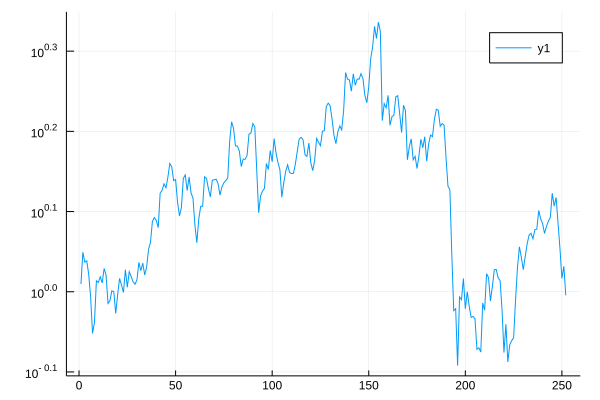

In [128]:
plot(cumprod(1 .+ wrs[1]),yscale=:log)